# Step 1: Load the Model and Tokenizer
We load the t5-small model and its tokenizer from the HuggingFace library. The output_attentions=True argument ensures that the model returns attention weights.



In [2]:
from transformers import AutoTokenizer, T5ForConditionalGeneration
from bertviz import model_view, head_view
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load T5 tokenizer and model
tokenizer = AutoTokenizer.from_pretrained("t5-small")
model = T5ForConditionalGeneration.from_pretrained("t5-small", output_attentions=True)


# Step 2: Prepare Inputs and Compute Attention

- Tokenize Inputs: Convert the input and target texts into sequences of token IDs using the tokenizer.
    -inputs.input_ids: Token IDs for the input text.
    - labels: Token IDs for the target text.
- Forward Pass: Pass the token IDs through the model to get the outputs, which include the attention weights and optionally the loss.
- Loss Calculation: If the model outputs a loss, it is printed. This typically happens if labels are provided correctly.

In [3]:
# Define input and target text
input_text = "But Ryan had an important project at work and went in to finish it."
target_text = "Ryan was proud of himself for finishing it. At the end of the day, he thanked his boss. Ryan was praised by his boss."

# Tokenize inputs (convert text to token IDs)
inputs = tokenizer(input_text, return_tensors="pt", add_special_tokens=True)
labels = tokenizer(target_text, return_tensors="pt", add_special_tokens=True).input_ids


print("Tokenized Input Text:")
print(f"Input IDs: {inputs.input_ids}")

print("\nTokenized Target Text:")
print(f"Label IDs: {labels}")


Tokenized Input Text:
Input IDs: tensor([[ 299, 7826,  141,   46,  359,  516,   44,  161,   11,  877,   16,   12,
         1992,   34,    5,    1]])

Tokenized Target Text:
Label IDs: tensor([[ 7826,    47,  2764,    13,  2448,    21,  8619,    34,     5,   486,
             8,   414,    13,     8,   239,     6,     3,    88,   145,  5100,
           112,  7930,     5,  7826,    47,     3, 24266,    57,   112,  7930,
             5,     1]])


In [4]:
# Forward pass through the model
# We pass the token IDs to the model to get the outputs, which include the attention weights.
outputs = model(input_ids=inputs.input_ids, labels=labels)

print("\nModel Outputs:")
print(outputs)


# Extract the loss
# We check if the loss is computed correctly.
if outputs.loss is not None:
    loss = outputs.loss
    print(f"\nLoss: {loss.item()}")
else:
    print("\nLoss is None, likely because labels were not provided correctly.")



Model Outputs:
Seq2SeqLMOutput(loss=tensor(3.0084, grad_fn=<NllLossBackward0>), logits=tensor([[[-16.3731,  -8.9782, -11.7305,  ..., -41.7879, -41.8261, -41.7650],
         [-20.5073,  -8.5688,  -9.5949,  ..., -38.4098, -38.4571, -38.4923],
         [-24.6778,  -6.2282, -10.3355,  ..., -34.6971, -34.8017, -34.8187],
         ...,
         [-23.1123,  -6.5827, -12.2831,  ..., -36.3822, -36.4408, -36.5016],
         [-20.2226,  -5.3384,  -8.9259,  ..., -39.0676, -39.1877, -39.1734],
         [-39.4109,  -5.3952, -17.4650,  ..., -59.1483, -59.2765, -59.2477]]],
       grad_fn=<UnsafeViewBackward0>), past_key_values=((tensor([[[[-0.4865, -2.3323, -1.1428,  ..., -2.5693, -1.7539, -0.5693],
          [ 0.1934, -0.1242, -1.0685,  ..., -1.7168,  0.4333,  0.5339],
          [ 2.6456, -0.7596, -0.0335,  ..., -0.7589, -0.8528,  0.5651],
          ...,
          [ 0.3578,  0.2643,  0.3533,  ..., -1.7947,  2.2145,  0.0898],
          [ 1.5117,  1.8726,  0.1962,  ...,  0.6666, -0.6260, -0.8353],
  

# Step 3: Convert Input IDs to Tokens

Convert the token IDs back into human-readable tokens for visualization purposes. This helps in understanding the attention visualizations by showing which words the attention heads are focusing on.

- Token IDs: Numerical representations of tokens.
- Tokens: Human-readable text corresponding to the token IDs.

In [5]:
# This step involves converting the token IDs back into human-readable tokens (words or subwords).
# This is useful for interpreting the attention visualizations, as it allows us to see which tokens (words) 
# the attention heads are focusing on.
# Convert IDs to tokens (for visualization purposes)
encoder_text = tokenizer.convert_ids_to_tokens(inputs.input_ids[0])
decoder_text = tokenizer.convert_ids_to_tokens(labels[0])


print("\nEncoder Tokens:")
print(encoder_text)
print("\nDecoder Tokens:")
print(decoder_text)


Encoder Tokens:
['▁But', '▁Ryan', '▁had', '▁an', '▁important', '▁project', '▁at', '▁work', '▁and', '▁went', '▁in', '▁to', '▁finish', '▁it', '.', '</s>']

Decoder Tokens:
['▁Ryan', '▁was', '▁proud', '▁of', '▁himself', '▁for', '▁finishing', '▁it', '.', '▁At', '▁the', '▁end', '▁of', '▁the', '▁day', ',', '▁', 'he', '▁than', 'ked', '▁his', '▁boss', '.', '▁Ryan', '▁was', '▁', 'praised', '▁by', '▁his', '▁boss', '.', '</s>']


# Step 4: Visualize Attention with Model View



- Encoder Self-Attention: This shows how each token in the input text attends to every other token within the same input text.     

        - Input text: "But Ryan had an important project at work and went in to finish it," 
        - you can see how the word "Ryan" might attend more to the words "project" and "work" compared to other tokens.

- Decoder Self-Attention: This shows how each token in the output text attends to every other token within the same output text. 

        - The target text: "Ryan was proud of himself for finishing it. At the end of the day, he thanked his boss. Ryan was praised by his boss," 
        - you can see how the word "Ryan" attends to "praised" and "boss."

- Cross-Attention: This shows how each token in the output text attends to tokens in the input text. This is essential for understanding how the model generates the output based on the input. 

        - You can see how the word "praised" in the output text might attend to the words "important project" in the input text.



In [11]:
# Visualize attention
print(outputs.encoder_attentions[-1].shape)
print(outputs.decoder_attentions[-1].shape)
print(outputs.cross_attentions[-1].shape)
print(len(encoder_text))
print(len(decoder_text))

model_view(
    encoder_attention=outputs.encoder_attentions,  # Encoder self-attention weights
    decoder_attention=outputs.decoder_attentions,  # Decoder self-attention weights
    cross_attention=outputs.cross_attentions,      # Cross-attention weights between encoder and decoder
    encoder_tokens=encoder_text,                   # Human-readable tokens of the input sequence
    decoder_tokens=decoder_text                    # Human-readable tokens of the output sequence
)


torch.Size([1, 8, 16, 16])
torch.Size([1, 8, 32, 32])
torch.Size([1, 8, 32, 16])
16
32


<IPython.core.display.Javascript object>

# Step 4: Visualize Attention with Head View
 The head_view function from BertViz visualizes the attention for one or more attention heads in the same layer.
 This allows us to see detailed attention patterns for individual heads.


- Encoder Self-Attention visualizes how each token in the input text attends to every other token within the same input text.
Input text: "But Ryan had an important project at work and went in to finish it."
Example: You can see how the word "Ryan" might attend more to the words "important project" and "work" compared to other tokens. This means that the attention head is focusing on the context around "Ryan" to better understand the sentence structure and meaning.

- Decoder Self-Attention visualizes how each token in the output text attends to every other token within the same output text.
Target text: "Ryan was proud of himself for finishing it. At the end of the day, he thanked his boss. Ryan was praised by his boss."
Example: You can see how the word "Ryan" attends to "praised" and "boss." This shows that the attention head is focusing on the relationship between "Ryan" and the actions related to him in the output text.

- Cross-Attention visualizes how each token in the output text attends to tokens in the input text. This is essential for understanding how the model generates the output based on the input.
Example: You can see how the word "praised" in the output text might attend to the words "important project" in the input text. This shows that the model is making a connection between Ryan being praised and the completion of the important project, reflecting how the input information influences the generated output.


In [7]:

head_view(
    encoder_attention=outputs.encoder_attentions,  # Encoder self-attention weights
    decoder_attention=outputs.decoder_attentions,  # Decoder self-attention weights
    cross_attention=outputs.cross_attentions,      # Cross-attention weights
    encoder_tokens=encoder_text,                   # Tokens from the encoder (input text)
    decoder_tokens=decoder_text,                   # Tokens from the decoder (target text)
    layer=0,                                       # Specify the layer you want to visualize (here, layer 0)
    heads=[0]                                      # Specify the head(s) you want to visualize (here, head 0)
)




<IPython.core.display.Javascript object>

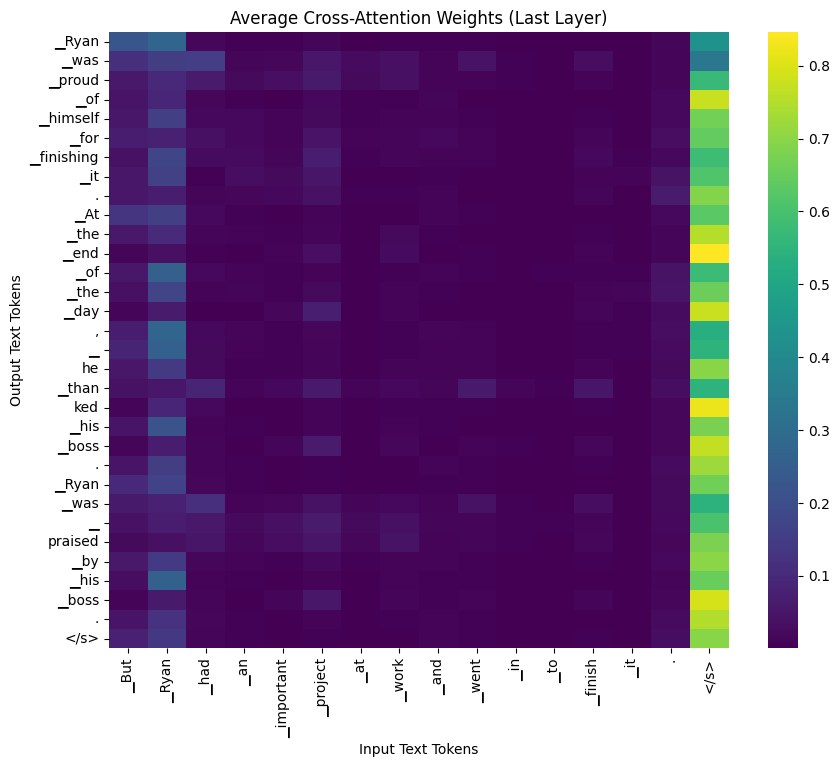

In [8]:
# Step 5: Visualize Attention with Matplotlib

# Choose the last layer
layer = -1

# Extract cross-attention weights for the chosen layer and average over all heads
cross_attention_weights = outputs.cross_attentions[layer].mean(dim=1).detach().numpy()[0]

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cross_attention_weights, xticklabels=encoder_text, yticklabels=decoder_text, cmap='viridis')
plt.xlabel("Input Text Tokens")
plt.ylabel("Output Text Tokens")
plt.title(f"Average Cross-Attention Weights (Last Layer)")
plt.show()

# All code 

Tokenized Input Text:
Input IDs: tensor([[ 299, 7826,  141,   46,  359,  516,   44,  161,   11,  877,   16,   12,
         1992,   34,    5,    1]])

Tokenized Target Text:
Label IDs: tensor([[ 7826,    47,  2764,    13,  2448,    21,  8619,    34,     5,   486,
             8,   414,    13,     8,   239,     6,     3,    88,   145,  5100,
           112,  7930,     5,  7826,    47,     3, 24266,    57,   112,  7930,
             5,     1]])

Model Outputs:
Seq2SeqLMOutput(loss=None, logits=tensor([[[-32.3740, -11.4094, -14.7148,  ..., -47.6243, -47.7152, -47.7067],
         [-37.5150, -12.0676, -19.1902,  ..., -51.2249, -51.4203, -51.3028],
         [-32.7478,  -8.9348, -14.2302,  ..., -48.9828, -49.0637, -48.9650],
         ...,
         [-26.7991,  -6.3367, -11.3479,  ..., -44.5291, -44.6684, -44.6641],
         [-30.5946,  -3.7231, -14.5610,  ..., -49.2908, -49.4026, -49.3896],
         [-36.6623,  -4.7507, -16.5916,  ..., -51.8815, -51.9975, -51.9546]]],
       grad_fn=<UnsafeView

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

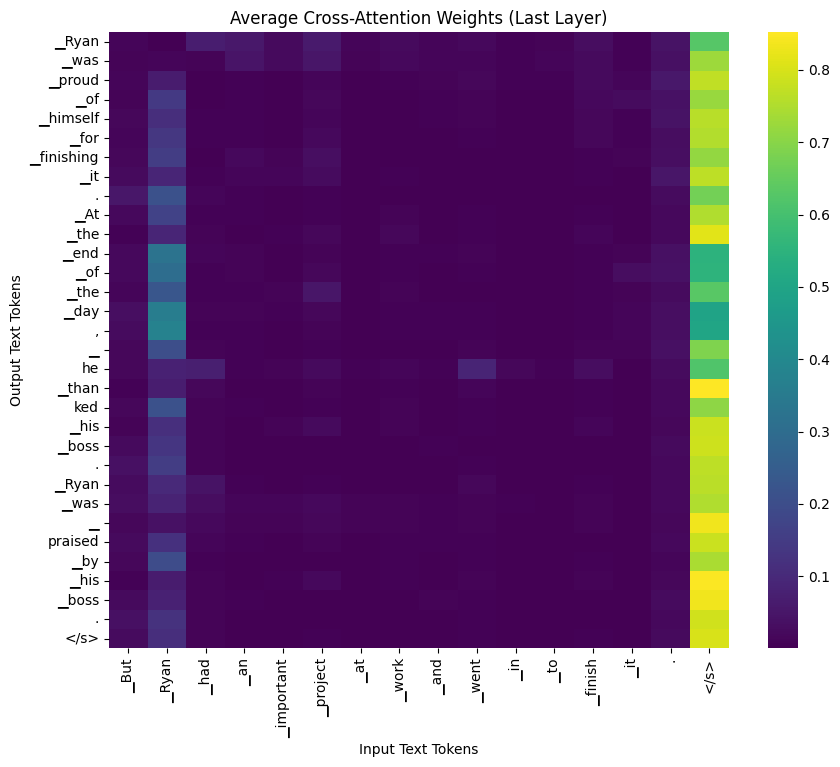

In [9]:
# Step 1: Load the Model and Tokenizer
# We start by loading the T5 model and tokenizer. The tokenizer converts text into token IDs 
# that the model can process, and the model itself generates the attention weights.
from transformers import AutoTokenizer, T5ForConditionalGeneration
from bertviz import model_view, head_view
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load T5 tokenizer and model
tokenizer = AutoTokenizer.from_pretrained("t5-small")
model = T5ForConditionalGeneration.from_pretrained("t5-small", output_attentions=True)

# Step 2: Prepare Inputs and Compute Attention

# Define input and target text
input_text = "But Ryan had an important project at work and went in to finish it."
target_text = "Ryan was proud of himself for finishing it. At the end of the day, he thanked his boss. Ryan was praised by his boss."

# Tokenize inputs (convert text to token IDs)
inputs = tokenizer(input_text, return_tensors="pt", add_special_tokens=True)
labels = tokenizer(target_text, return_tensors="pt", add_special_tokens=True).input_ids

print("Tokenized Input Text:")
print(f"Input IDs: {inputs.input_ids}")

print("\nTokenized Target Text:")
print(f"Label IDs: {labels}")

# Forward pass through the model
# We pass the token IDs to the model to get the outputs, which include the attention weights.
outputs = model(input_ids=inputs.input_ids, decoder_input_ids=labels)

print("\nModel Outputs:")
print(outputs)

# Extract the loss and print it
# We check if the loss is computed correctly.
if outputs.loss is not None:
    loss = outputs.loss
    print(f"\nLoss: {loss.item()}")
else:
    print("\nLoss is None, likely because labels were not provided correctly.")

# Step 3: Convert Input IDs to Tokens
# This step involves converting the token IDs back into human-readable tokens (words or subwords).
# This is useful for interpreting the attention visualizations, as it allows us to see which tokens (words) 
# the attention heads are focusing on.

# Convert IDs to tokens (for visualization purposes)
encoder_text = tokenizer.convert_ids_to_tokens(inputs.input_ids[0])
decoder_text = tokenizer.convert_ids_to_tokens(labels[0])

print("\nEncoder Tokens:")
print(encoder_text)
print("\nDecoder Tokens:")
print(decoder_text)

# Step 4: Visualize Attention with BertViz

# Using model_view from BertViz to visualize the attention. 
# This function takes the attention weights and the tokens (both input and output) 
# and displays an interactive visualization.
model_view(
    encoder_attention=outputs.encoder_attentions,
    decoder_attention=outputs.decoder_attentions,
    cross_attention=outputs.cross_attentions,
    encoder_tokens=encoder_text,
    decoder_tokens=decoder_text
)

head_view(
    encoder_attention=outputs.encoder_attentions,  # Encoder self-attention weights
    decoder_attention=outputs.decoder_attentions,  # Decoder self-attention weights
    cross_attention=outputs.cross_attentions,      # Cross-attention weights
    encoder_tokens=encoder_text,                   # Tokens from the encoder (input text)
    decoder_tokens=decoder_text,                   # Tokens from the decoder (target text)
    layer=0,                                       # Specify the layer you want to visualize (here, layer 0)
    heads=[0]                                      # Specify the head(s) you want to visualize (here, head 0)
)


# Step 5: Visualize Attention with Matplotlib

# Choose the last layer
layer = -1

# Extract cross-attention weights for the chosen layer and average over all heads
cross_attention_weights = outputs.cross_attentions[layer].mean(dim=1).detach().numpy()[0]

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cross_attention_weights, xticklabels=encoder_text, yticklabels=decoder_text, cmap='viridis')
plt.xlabel("Input Text Tokens")
plt.ylabel("Output Text Tokens")
plt.title(f"Average Cross-Attention Weights (Last Layer)")
plt.show()
